In [1]:
%matplotlib inline
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

from itertools import chain

In [2]:
mini_df = pd.read_csv('data.csv')

In [72]:
mini_df

,id,day,lon,lat
0,0,0,-175.496201,-21.259300
1,0,1,-175.740204,-21.281717
2,0,2,-175.841034,-21.276018
3,0,3,-175.884720,-21.318092
4,0,4,-176.024948,-21.361267
...,...,...,...,...
365995,999,361,-71.170937,-29.967941
365996,999,362,-71.166550,-29.972687
365997,999,363,-71.165321,-29.969759
365998,999,364,-71.162170,-29.959507


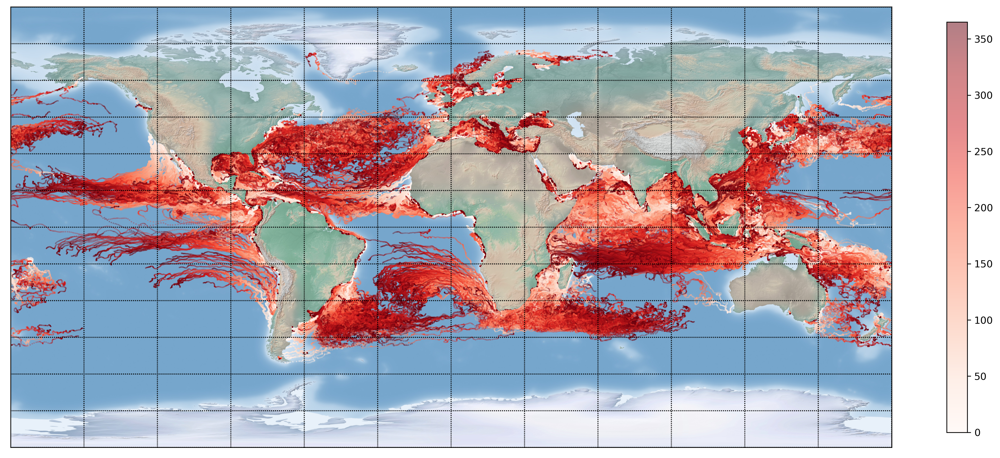

In [11]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
def draw_map(m, scale=0.2):
    # draw a shaded-relief image
    m.shadedrelief(scale=scale)

    # lats and longs are returned as a dictionary
    lats = m.drawparallels(np.linspace(-90, 90, 13))
    lons = m.drawmeridians(np.linspace(-180, 180, 13))

fig = plt.figure(figsize=(20, 15), edgecolor='w')
m = Basemap(projection='cyl', resolution=None,
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180, )

draw_map(m)
plot_data = m.scatter(mini_df['lon'], mini_df['lat'], s=0.1, latlon=True, c=mini_df['day'],
          cmap='Reds', alpha=0.5)

plt.colorbar(plot_data, shrink=0.5)
plt.clim(0, 365)

In [14]:
init_data = pd.read_csv('initial-locations-global.csv')

In [34]:
def ds_country(dataset_init, dataset_traj, country):
  num_traj = []

  for index, row in dataset_init.iterrows():
    if row["country"] == country:
      num_traj += list(range(index*366, index*366+366))

  dataset_return = dataset_traj[dataset_traj.index.isin(num_traj)]
  return dataset_return

spain_data = ds_country(init_data,  mini_df, "Spain")

In [36]:
spain_data

,id,day,lon,lat
618906,1691,0,-16.892799,27.843399
618907,1691,1,-17.013987,27.753176
618908,1691,2,-17.131651,27.686930
618909,1691,3,-17.211060,27.584074
618910,1691,4,-17.158531,27.481525
...,...,...,...,...
3352189,9158,361,8.174779,40.715652
3352190,9158,362,8.175207,40.716545
3352191,9158,363,8.173492,40.715183
3352192,9158,364,8.172827,40.717350


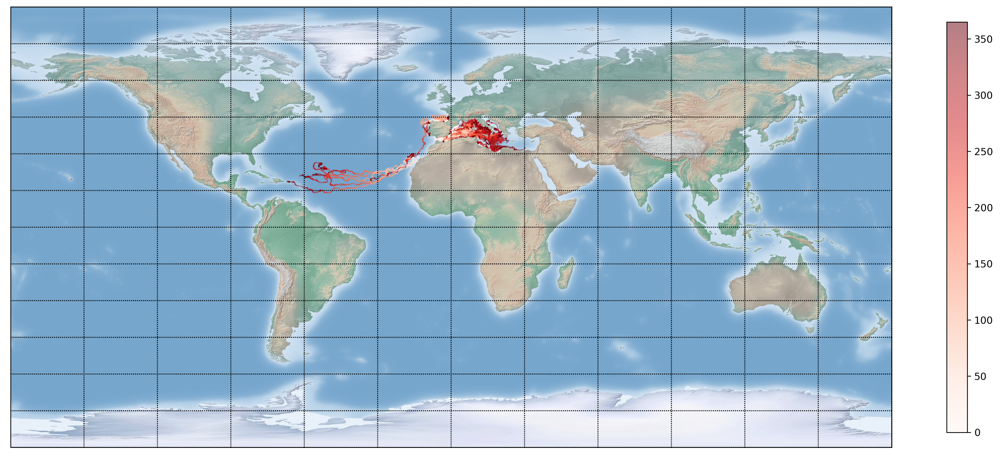

In [44]:
fig = plt.figure(figsize=(20, 15), edgecolor='w')
m = Basemap(projection='cyl', resolution=None,
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180, )

draw_map(m)
plot_data = m.scatter(spain_data['lon'], spain_data['lat'], s=0.1, latlon=True, c=spain_data['day'],
          cmap='Reds', alpha=0.5)


plt.colorbar(plot_data, shrink=0.5)
plt.clim(0, 365)